# Analysis - Aiman Hasan - Issue # 35

This analysis is built up on the analysis in `analyses/hello_mozfest.ipynb`. 

# Analysis - 1
The unique values are found out by checking keywords such as **" = , id, ID, iD, Id, =, ;, : "** in values_1000 column, because `<name> = <value>` are separated by **" =, ;, :"**. 
1. Finding keyword of **id** in values, shows that `RTCPeerConnection.localDescription`, `window.document.cookie`,`window.localStorage`, `window.name`, `window.sessionStorage` are the API symbols which are estimated to store unique values. `window.document.cookie` is estimated to store most values. The plot for reference can be found <a href='#analysis-1.1'>here</a> 

1. Finding separators or assignmnents such as  **=, ;, :**, shows that `HTMLCanvasElement.style`, `RTCPeerConnection.localDescription`, `window.document.cookie`, `window.localStorage`, `window.name`, `window.navigator.userAgent`, `window.sessionStorage` are the API symbols which are estimated to store unique values. `window.document.cookie` is estimated to store most values again. The plot for reference can be found <a href='#analysis-1.2'>here</a> 

1. For more accuracy, an analysis is done with **"="** assignment only. shows that `HTMLCanvasElement.style`, `RTCPeerConnection.localDescription`, `window.document.cookie`, `window.localStorage`, `window.name`, `window.navigator.userAgent`, `window.sessionStorage` are the API symbols which are estimated to store unique values. `window.document.cookie` is estimated to store most values again. The plot for reference can be found <a href='#analysis-1.3'>here</a> 

# Analysis - 2
Work not completed yet. Can be found <a href='#analysis-2.1'>here</a>


In [192]:
import pandas as pd
import os.path

In [193]:
## Don't limit pandas display.
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", -1)

Specify the base dir where you have saved the dataset.

In [194]:
DATA_DIR = "C:\\Users\\hamza\\Downloads\\safe_dataset.sample (1)"  ## Change me

We are primarily interested in the `value` column, representing the value returned from each API call. We retain it and a few other relevant columns for analysis.

In [195]:
COLUMNS = [
    "arguments",
    "location",  ## The URL of the page that was crawled
    "script_url",  ## The script where the call was made
    "symbol",  ## The JS API symbol
    "value",  ## The value returned
    "value_1000",  ## The value truncated to 1000 chars
    "value_len"  ## The number of chars in the full value string
]

In [196]:
SAMPLE_DATA_PARQUET = os.path.join(DATA_DIR,
                                   "sample",
                                   "part-00000-34d9b361-ea79-42eb-82ee-9c9f9259c339-c000.snappy.parquet")

In [197]:
df = pd.read_parquet(SAMPLE_DATA_PARQUET,
                     engine="pyarrow",
                     columns=COLUMNS)

Restrict to operations that returned a value.

In [198]:
df_value_exists = df[df.value_len > 0]

How many rows with values are there in the sample?

In [199]:
len(df_value_exists)

7314

How many unique values are there?

In [200]:
len(df_value_exists.value.unique())

1223

What are the symbols that returned values?

In [201]:
df_value_exists.symbol.value_counts().sort_index()

CanvasRenderingContext2D.fillStyle                                       39  
CanvasRenderingContext2D.font                                            18  
CanvasRenderingContext2D.globalCompositeOperation                        2   
CanvasRenderingContext2D.lineWidth                                       10  
CanvasRenderingContext2D.shadowBlur                                      20  
CanvasRenderingContext2D.shadowColor                                     20  
CanvasRenderingContext2D.shadowOffsetX                                   20  
CanvasRenderingContext2D.shadowOffsetY                                   20  
CanvasRenderingContext2D.strokeStyle                                     4   
CanvasRenderingContext2D.textBaseline                                    7   
HTMLCanvasElement.height                                                 35  
HTMLCanvasElement.nodeName                                               2   
HTMLCanvasElement.nodeType                                      

In [202]:
df_value_exists.head()

,arguments,location,script_url,symbol,value,value_1000,value_len
0,{},https://staticxx.facebook.com/connect/xd_arbiter/r/lY4eZXm_YWu.js?version=42#channel=f30ef17b61f384&origin=http%3A%2F%2Fwww.ubitennis.com,https://staticxx.facebook.com/connect/xd_arbiter/r/lY4eZXm_YWu.js?version=42#channel=f30ef17b61f384&origin=http%3A%2F%2Fwww.ubitennis.com,window.name,fb_xdm_frame_https,fb_xdm_frame_https,18
1,{},https://staticxx.facebook.com/connect/xd_arbiter/r/lY4eZXm_YWu.js?version=42#channel=f30ef17b61f384&origin=http%3A%2F%2Fwww.ubitennis.com,https://staticxx.facebook.com/connect/xd_arbiter/r/lY4eZXm_YWu.js?version=42#channel=f30ef17b61f384&origin=http%3A%2F%2Fwww.ubitennis.com,window.name,fb_xdm_frame_https,fb_xdm_frame_https,18
3,{},https://staticxx.facebook.com/connect/xd_arbiter/r/lY4eZXm_YWu.js?version=42#channel=f30ef17b61f384&origin=http%3A%2F%2Fwww.ubitennis.com,https://staticxx.facebook.com/connect/xd_arbiter/r/lY4eZXm_YWu.js?version=42#channel=f30ef17b61f384&origin=http%3A%2F%2Fwww.ubitennis.com,window.navigator.userAgent,Mozilla/5.0 (X11; Linux x86_64; rv:52.0) Gecko/20100101 Firefox/52.0,Mozilla/5.0 (X11; Linux x86_64; rv:52.0) Gecko/20100101 Firefox/52.0,68
4,{},https://cas.us.criteo.com/delivery/r/afr.php?did=5a34c73ff17390f0eaeb591979874b00&z=WjTHPwAHZYkKT7BIAAcskrRh4Qozh3b-c-mtZg&u=%7C7J5NcLNwKWZvhHazrdQ0r3pEybQM2VrhNSue519M%2FnU%3D%7C&c1=M5BADJe1UR3zJ2HNju9b10FggySKKMK0AoYTtPDcqDnSIQIZUQPlDupK--OP2eR-eNGQ46cgN3mwCl5UMg4IstlvomsUbHEHUzImPBAbL0KpTFeMsdEkBo28MAQVY_79HvMen3pU9pjoRxbnxk_AxatU3fdvCPtFY7Wzui5q962zi71J5i_HHNmYi7XbHxLl1v3NLOEqWiI-3QfHE1byzwOhuyge44QAJfUpukDSr4X723xUoquihjIy6b6D_yU9AsLHIIxKQk64_ES4G8moUw5dbt7SG3KWRhyjzAZW5acfRwaX8v33UzaCSZKj4O0XffzJaDiMmsprtAOP0J4xHPtfZqvurKt_x3z5y83mK1o&ct0=https://adclick.g.doubleclick.net/aclk%3Fsa%3Dl%26ai%3DCcqaRP8c0WonLHcjgvgKS2ZyADO7lmPBNsu23nZ0BwI23ARABIABgyQaCARdjYS1wdWItNTc4NzU5MjQ4Mzc2Njc2MKABrN3-6APIAQngAgCoAwGqBMUBT9DGnU9Xf5zpWjsp7PXxVDLu7mhvsOzx8jjeTb-wk_FUQNpBqVd4QxwydKBkX31VemFtAuP1QMeGjoHagpA44JfU11OU46ZLmBKcADPeCDg8kDPJvowA7EbbZ6gvml2aRO7nKo1LHNbLoGTBvP6gmhnbhVqThagbrECDM6qxbcRiiWobTKajDG8KeWma5flmrMZiQe5Lu3cyX_WMmu36IIP2lojiMZaZvgiE_ncYb24UZCKxrORb0gO54t1XHQFwzDnBRPXgBAGABufvkeKYhIzL9gGgBiGoB6a-G9gHANIIBQiAYRAB8ggbYWR4LXN1YnN5bi0wOTI1MDI4NTk2NjIxNjE3%26num%3D1%26sig%3DAOD64_1ibrZmc1pVLttz4doqoDmSHOvwXg%26client%3Dca-pub-5787592483766760%26adurl%3D,https://ajax.googleapis.com/ajax/libs/webfont/1.6.26/webfont.js,window.navigator.userAgent,Mozilla/5.0 (X11; Linux x86_64; rv:52.0) Gecko/20100101 Firefox/52.0,Mozilla/5.0 (X11; Linux x86_64; rv:52.0) Gecko/20100101 Firefox/52.0,68
5,{},http://pos.baidu.com/rcwm?rdid=2835655&dc=3&di=u2835655&dri=0&dis=0&dai=3&ps=3595x465&enu=encoding&dcb=___adblockplus&dtm=HTML_POST&dvi=0.0&dci=-1&dpt=none&tsr=0&tpr=1513385038346&ti=%E5%93%8D%E5%B7%A2%E7%9C%8B%E7%9C%8B(%E5%8E%9F%E8%BF%85%E9%9B%B7%E7%9C%8B%E7%9C%8B)%E5%85%8D%E8%B4%B9%E4%B8%8B%E8%BD%BD_%E5%93%8D%E5%B7%A2%E7%9C%8B%E7%9C%8B(%E5%8E%9F%E8%BF%85%E9%9B%B7%E7%9C%8B%E7%9C%8B)%E5%AE%98%E6%96%B9%E4%B8%8B%E8%BD%BD_%E5%93%8D%E5%B7%A2%E7%9C%8B%E7%9C%8B(%E5%8E%9F%E8%BF%85%E9%9B%B7%E7%9C%8B%E7%9C%8B)5.2.0.56-%E5%8D%8E%E5%86%9B%E8%BD%AF%E4%BB%B6%E5%9B%AD&ari=2&dbv=0&drs=1&pcs=1353x697&pss=1353x3840&cfv=28&cpl=1&chi=1&cce=true&cec=UTF-8&tlm=1513385041&rw=697&ltu=http%3A%2F%2Fwww.onlinedown.net%2Fsoft%2F119012.htm&ecd=1&uc=1366x768&pis=-1x-1&sr=1366x768&tcn=1513385041&qn=3a0e875efc7e7034&tt=1513385038271.3180.3403.3404,http://cpro.baidustatic.com/cpro/ui/noexpire/js/4.0.1/adClosefeedbackUpgrade.min.js,window.navigator.userAgent,Mozilla/5.0 (X11; Linux x86_64; rv:52.0) Gecko/20100101 Firefox/52.0,Mozilla/5.0 (X11; Linux x86_64; rv:52.0) Gecko/20100101 Firefox/52.0,68


In [203]:
df_id=df_value_exists[df_value_exists.value_1000.str.contains('ID', case = False, regex = True)]
df_equals = df_value_exists[df_value_exists.value_1000.str.contains('=', regex = True)]
df_all_separators_assignments = df_value_exists[df_value_exists.value_1000.str.contains('=|;|:', regex = True)]

In [204]:
df_symbol_id_counts = df_id.symbol.value_counts().sort_index()
df_symbol_equals_counts = df_equals.symbol.value_counts().sort_index()
df_all_separators_assignments_counts = df_all_separators_assignments.symbol.value_counts().sort_index()

<a id='analysis-1.1'></a>
Plot showing symbols found which have returned values containing **ID** as a keyword.

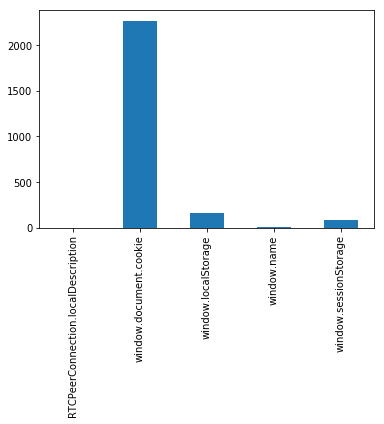

In [205]:
df_symbol_id_counts.plot(kind = "bar")


<a id='analysis-1.2'></a>
Plot showing symbols found which have returned values containing **"=, ;, :"** as separator or assignment symbols

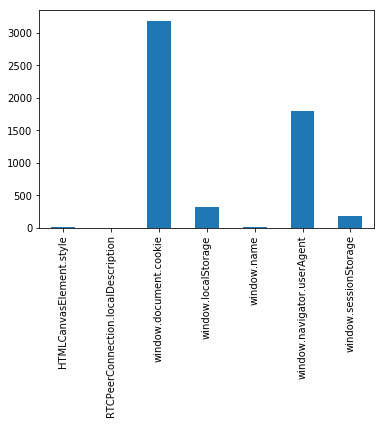

In [206]:
df_all_separators_assignments_counts.plot(kind = "bar")

<a id='analysis-1.3'></a>
Plot showing symbols found which have returned values containing **"="** as assignment symbols

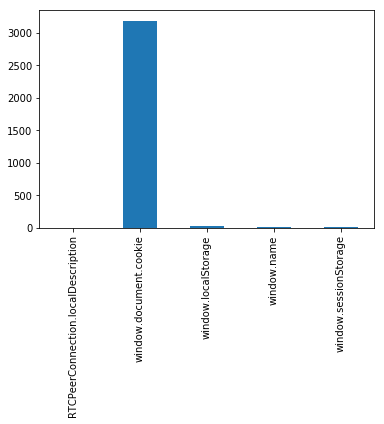

In [207]:
df_symbol_equals_counts.plot(kind = "bar")


The dataset contains cookies that were accessed via the JS API (`window.document.cookie`). They are stored as key-value pairs of the form `<name>=<value>`, delimited by `;`. Note, however, that this only represents a subset of all cookies used, since we don't have visibility into those that are sent with each request.

In [152]:
df_cookies = df_value_exists[df_value_exists.symbol == "window.document.cookie"]

In [153]:
df_cookies.head()

,arguments,location,script_url,symbol,value,value_1000,value_len
50,{},https://www.syracuse.edu/about/,https://www.google-analytics.com/analytics.js,window.document.cookie,"_ga=GA1.2.1687044407.1513387667; path=/; expires=Mon, 16 Dec 2019 01:27:47 GMT; domain=syracuse.edu;","_ga=GA1.2.1687044407.1513387667; path=/; expires=Mon, 16 Dec 2019 01:27:47 GMT; domain=syracuse.edu;",100
51,{},https://www.syracuse.edu/about/,https://www.google-analytics.com/analytics.js,window.document.cookie,_ga=GA1.2.1687044407.1513387667,_ga=GA1.2.1687044407.1513387667,31
52,{},https://www.syracuse.edu/about/,https://www.google-analytics.com/analytics.js,window.document.cookie,_ga=GA1.2.1687044407.1513387667,_ga=GA1.2.1687044407.1513387667,31
53,{},https://www.syracuse.edu/about/,https://www.google-analytics.com/analytics.js,window.document.cookie,_ga=GA1.2.1687044407.1513387667,_ga=GA1.2.1687044407.1513387667,31
54,{},https://www.syracuse.edu/about/,https://www.google-analytics.com/analytics.js,window.document.cookie,"_gid=GA1.2.794143.1513387667; path=/; expires=Sun, 17 Dec 2017 01:27:47 GMT; domain=syracuse.edu;","_gid=GA1.2.794143.1513387667; path=/; expires=Sun, 17 Dec 2017 01:27:47 GMT; domain=syracuse.edu;",97


How many cookie values are there in the sample?

In [154]:
len(df_cookies)

3189

### Analysis based on finding Unique IDs from value

How many cookies were accessed in each call, and what is the distribution?

In [155]:
def parse_cookie_entries(contents):
    """Split value contents into '<name>=<value>' strings."""
    entries = contents.split(";")
    cleaned_entries = [e.strip() for e in entries if len(e) > 0]
    return cleaned_entries

In [156]:
cookie_num_entries = df_cookies.value.apply(lambda c: len(parse_cookie_entries(c)))

In [157]:
name_value = df_cookies.value.apply(parse_cookie_entries)


In [158]:
cookie_num_entries.value_counts().sort_index()

1     158
2     308
3     363
4     681
5     180
6     174
7     154
8     48 
9     115
10    67 
11    44 
12    77 
13    58 
14    114
15    67 
16    107
17    96 
18    59 
19    61 
20    13 
21    23 
22    10 
23    13 
24    6  
25    14 
26    21 
27    22 
28    2  
29    16 
30    3  
31    5  
32    23 
33    3  
34    84 
Name: value, dtype: int64

### Working with arguments
<a id='analysis-2.1'></a>

In [159]:
df['arguments'].nunique()

749

Finding only the values from cookies <name>=<value> pair

In [160]:
cleaned_entries = [j.split('=')[1] for e in name_value if len(e) > 0 for j in e if (len(j.split('='))>1 and (len(j.split('=')[1]) > 0))]

In [161]:
len(cleaned_entries)

26740

In [162]:
import numpy as np
cleaned_entries = np.unique(np.array(cleaned_entries))


In [163]:
cleaned_entries = cleaned_entries.tolist()
print(cleaned_entries)

['!UOQOLMykpJUYZw5lqHwr31BVacIjk6Tn1SSawmdlaiOSUwiJdrF0kpUUFK0OUs4d2owns13NYN30Cr8ys/iMqN4CKako8GM/lkzsxFl4gcuLiTfXnC8lEpXEfTHvmNFQqWKvN1/bVPSg66tSmng/8g65YCMkT2Q', '""', '"sl', '"v1_7Nqx7WgARKkyql4Ps5rKig', '$43260$', '%20s_cc%3Dtrue%3B%20s_prevsite%3Dshwtvideo%3B%20s_sq%3D%3B', '%20s_fid%3D47CBF715C3AF0EE6-167F880BA503D48C%7C1576527897009%3B', '%2d1%2c10151', '%2d1002%2c10151%2cnull%2cnull%2cnull%2cnull%2cnull%2cnull%2cnull%2cnull%2cUu24%2fUlPbKYPxc7nGyD2K7flJKWHM2SZJoSh8UQ%2bJ4pPGQVTCdwQZ4Au2%2bQ1f9ZMLY8Y8Zf0MOmO%0afUKaWoassiHZcNaRxr5x5sh20ncgOujopJr6ZMs9uO%2fLbvvxZnOH0FAfcxsC37DUHNTSTdxVd4Nz%0acHLwdTC6mgVTgayM9gnMuW5ZBHFB3byGqoMPpFsKdFX%2bYzYKN0sx1W%2bqwjZoCA%3d%3d', '%2d1002%2caH04lvZPDCL5uRr%2fEORnyW%2b3h%2bc%3d', '%3F', '%5B%22n%3Dhttp%253A%252F%252Fwww.ufc.ca%252Fmedia%252FSubmission-of-the-Week-Mickey-Gall-vs-Mike-Jackson%26u%3Doeu1513383432864r0.3440539361011914%26wxhr%3Dtrue%26time%3D1513383432.972%26f%3D3444161321%2C6727930006%2C5737351521%2C9416284852%2C7632071432%2C709905

In [164]:
cleaned_entries = [e for e in cleaned_entries if (len(e) > 5)]


In [165]:
import re
df2 = pd.DataFrame()
for i in range(len(cleaned_entries)):
    #print(re.escape(cleaned_entries[i]))
    df2 = pd.concat([df2, df[df.arguments.str.contains(re.escape(cleaned_entries[i]), regex = True)]])

#df2 = df[df.arguments.str.contains(re.escape(cleaned_entries[2]), regex = True)]
#print(re.escape(cleaned_entries[3]))

In [166]:
len(df2)

542

In [167]:
df2[400:500] #TODO Mujhe "" se split karna hai phrr compare karien ge aur arguments bhi check karein ge alag se us mein bhi same scene jo ham ne value ke saath kiya hai phhrr bs submit the analyses


arguments  \
3999  {"0":"optimizely_data$$pending_events","1":"{\"c89a64c4-9bd9-44aa-a4bb-8f60647e95cd\":{\"id\":\"c89a64c4-9bd9-44aa-a4bb-8f60647e95cd\",\"timeStamp\":1513464673371,\"data\":{\"url\":\"https://logx.optimizely.com/log/decision\",\"method\":\"POST\",\"data\":{\"decisionId\":\"c89a64c4-9bd9-44aa-a4bb-8f60647e95cd\",\"anonymizeIP\":false,\"timestamp\":1513464673367,\"revision\":\"6067\",\"clientEngine\":\"js\",\"clientVersion\":\"0.80.0\",\"projectId\":\"8780712086\",\"accountId\":\"6529002483\",\"layerId\":\"8779034036\",\"activationId\":\"1513464672610\",\"sessionId\":\"AUTO\",\"visitorId\":\"oeu1513464670189r0.5490705732654261\",\"decisionTicket\":{\"audiences\":[{\"id\":\"8217341548\"}],\"bucketingId\":\"oeu1513464670189r0.5490705732654261\"},\"decision\":{\"experimentId\":null,\"variationId\":null,\"isLayerHoldback\":false},\"userFeatures\":[{\"id\":null,\"type\":\"first_session\",\"name\":\"\",\"shouldIndex\":true,\"value\":true},{\"id\":null,\"type\":\"browserId\",\"name\":\"\",\"shouldIndex\":true,\"value\":\"ff\"},{\"id\":\"8295478163\",\"type\":\"custom\",\"name\":\"8295478163\",\"shouldIndex\":true,\"value\":\"www.gap.com\"},{\"id\":null,\"type\":\"device\",\"name\":\"\",\"shouldIndex\":true,\"value\":\"desktop\"},{\"id\":null,\"type\":\"source_type\",\"name\":\"\",\"shouldIndex\":true,\"value\":\"direct\"},{\"id\":null,\"type\":\"currentTimestamp\",\"name\":\"\",\"shouldIndex\":true,\"value\":1513464673363}],\"isGlobalHoldback\":false}},\"retryCount\":0},\"ca0b6d20-59b5-479c-b56c-16cc5a07bb8f\":{\"id\":\"ca0b6d20-59b5-479c-b56c-16cc5a07bb8f\",\"timeStamp\":1513464673400,\"data\":{\"url\":\"https://logx.optimizely.com/log/decision\",\"method\":\"POST\",\"data\":{\"decisionId\":\"ca0b6d20-59b5-479c-b56c-16cc5a07bb8f\",\"anonymizeIP\":false,\"timestamp\":1513464673399,\"revision\":\"6067\",\"clientEngine\":\"js\",\"clientVersion\":\"0.80.0\",\"projectId\":\"8780712086\",\"accountId\":\"6529002483\",\"layerId\":\"8781681327\",\"activationId\":\"1513464672610\",\"sessionId\":\"AUTO\",\"visitorId\":\"oeu1513464670189r0.5490705732654261\",\"decisionTicket\":{\"audiences\":[],\"bucketingId\":\"oeu1513464670189r0.5490705732654261\"},\"decision\":{\"experimentId\":\"8780850518\",\"variationId\":\"8781840473\",\"isLayerHoldback\":false},\"userFeatures\":[{\"id\":null,\"type\":\"first_session\",\"name\":\"\",\"shouldIndex\":true,\"value\":true},{\"id\":null,\"type\":\"browserId\",\"name\":\"\",\"shouldIndex\":true,\"value\":\"ff\"},{\"id\":\"8295478163\",\"type\":\"custom\",\"name\":\"8295478163\",\"shouldIndex\":true,\"value\":\"www.gap.com\"},{\"id\":null,\"type\":\"device\",\"name\":\"\",\"shouldIndex\":true,\"value\":\"desktop\"},{\"id\":null,\"type\":\"source_type\",\"name\":\"\",\"shouldIndex\":true,\"value\":\"direct\"},{\"id\":null,\"type\":\"currentTimestamp\",\"name\":\"\",\"shouldIndex\":true,\"value\":1513464673396}],\"isGlobalHoldback\":false}},\"retryCount\":0},\"ea0af661-4830-49bf-b0a7-79e5a4763e59\":{\"id\":\"ea0af661-4830-49bf-b0a7-79e5a4763e59\",\"timeStamp\":1513464673428,\"data\":{\"url\":\"https://logx.optimizely.com/log/decision\",\"method\":\"POST\",\"data\":{\"decisionId\":\"ea0af661-4830-49bf-b0a7-79e5a4763e59\",\"anonymizeIP\":false,\"timestamp\":1513464673426,\"revision\":\"6067\",\"clientEngine\":\"js\",\"clientVersion\":\"0.80.0\",\"projectId\":\"8780712086\",\"accountId\":\"6529002483\",\"layerId\":\"9112643756\",\"activationId\":\"1513464672610\",\"sessionId\":\"AUTO\",\"visitorId\":\"oeu1513464670189r0.5490705732654261\",\"decisionTicket\":{\"audiences\":[],\"bucketingId\":\"oeu1513464670189r0.5490705732654261\"},\"decision\":{\"experimentId\":\"9105733433\",\"variationId\":\"9110762213\",\"isLayerHoldback\":false},\"userFeatures\":[{\"id\":null,\"type\":\"first_session\",\"name\":\"\",\"shouldIndex\":true,\"value\":true},{\"id\":null,\"type\":\"browserId\",\"name\":\"\",\"shouldIndex\":true,\"value\":\"ff\"},{\"id\":\"8295478163\",\"type\":\"custom\",\"name\":\"8295478163\",\"shoul

In [168]:

    
def parse_arguments(lst):
    args = {}
    for i in range(len(lst)):
        args[i] = [e.strip('\\:,{}=') for e in lst[i].split('"')]
    return args

args = parse_arguments(df.arguments)

Checking if any of the id is in arguments

In [169]:
for i in cleaned_entries:
    for j in args:
        if i==j:
            print("Value exists")